In [1]:
import numpy as np 
import pandas as pd
import copy
from tqdm.notebook import tqdm
import plotly.express as px
from scipy import stats
import scipy.constants as const
import matplotlib.pyplot as plt

### Example from Jaguar Calculator

In [2]:
''''
Convert heat in frequency to temperature for cold chip and hot chip
'''

MRM_MAIN_HTR_RTH = 10972 # degC/W
CRR_HTR_RTH = 10068 # degC/W

MRM_MAIN_HTR_PFSR = 22e-3 # W
CRR_HTR_PFSR = 18.4e-3 # W

FSR_GHZ = 1800 # GHz

MRM_dT_FSR = 156 # degC
CRR_dT_FSR = 162.4 # degC

COLD_CHIP_TEMP = 10 # degC
MEDIAN_CHIP_TEMP = 65 #degC
HOT_CHIP_TEMP = 105 # degC

MAX_MRM_MAIN_HTR_TEMP = 10
MAX_CRR_HTR_TEMP = 10

MRM_MAIN_HTR_FREQ = 6/9 * FSR_GHZ # GHz
CRR_HTR_FREQ = 8/9 * FSR_GHZ # GHz

MRM_MAIN_HTR_CHIP_TEMP = (HOT_CHIP_TEMP - COLD_CHIP_TEMP)/MRM_dT_FSR*FSR_GHZ# degC
CRR_HTR_CHIP_TEMP = (HOT_CHIP_TEMP - COLD_CHIP_TEMP)/CRR_dT_FSR*FSR_GHZ # degC

MEDIAN_MRM_MAIN_HTR_CHIP_TEMP = (HOT_CHIP_TEMP - MEDIAN_CHIP_TEMP)/MRM_dT_FSR*FSR_GHZ# degC
MEDIAN_CRR_HTR_CHIP_TEMP = (HOT_CHIP_TEMP - MEDIAN_CHIP_TEMP)/CRR_dT_FSR*FSR_GHZ # degC

In [3]:
print(f"MRM Chip Temp FSR: {MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ:.2f} FSR, CRR Chip Temp FSR: {CRR_HTR_CHIP_TEMP/FSR_GHZ:.2f} FSR")
print(f'MRM Total FSR: {(MRM_MAIN_HTR_FREQ/FSR_GHZ + MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ):.2f} FSR, CRR Total FSR: {(CRR_HTR_FREQ/FSR_GHZ + CRR_HTR_CHIP_TEMP/FSR_GHZ):.2f} FSR')

MRM Chip Temp FSR: 0.61 FSR, CRR Chip Temp FSR: 0.58 FSR
MRM Total FSR: 1.28 FSR, CRR Total FSR: 1.47 FSR


In [4]:
cold_chip_mrm_main_htr_temp = COLD_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(MRM_MAIN_HTR_FREQ/FSR_GHZ + MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ) # degC
cold_chip_crr_htr_temp = COLD_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(CRR_HTR_FREQ/FSR_GHZ + CRR_HTR_CHIP_TEMP/FSR_GHZ) # degC

median_chip_mrm_main_htr_temp = MEDIAN_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(MRM_MAIN_HTR_FREQ/FSR_GHZ + MEDIAN_MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ) # degC 
median_chip_crr_htr_temp = MEDIAN_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(CRR_HTR_FREQ/FSR_GHZ + MEDIAN_CRR_HTR_CHIP_TEMP/FSR_GHZ) # degC

hot_chip_mrm_main_htr_temp = HOT_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(MRM_MAIN_HTR_FREQ/FSR_GHZ) # degC
hot_chip_crr_htr_temp = HOT_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(CRR_HTR_FREQ/FSR_GHZ) # degC

In [5]:

print(f'MRM Main Heater Temperature at COLD CHIP: {cold_chip_mrm_main_htr_temp:.2f} degC, Median MRM Main Heater Temperature at MEDIAN CHIP: {median_chip_mrm_main_htr_temp:0.2f} degC, Maximum MRM Main Heater Temperature at HOT CHIP: {hot_chip_mrm_main_htr_temp:.2f} degC')
print(f'CRR Heater Temperature at COLD CHIP: {cold_chip_crr_htr_temp:.2f} degC, Median CRR Heater Temperature at MEDIAN CHIP: {median_chip_crr_htr_temp:0.2f} degC, Maximum CRR Heater Temperature at HOT CHIP: {hot_chip_crr_htr_temp:.2f} degC')

MRM Main Heater Temperature at COLD CHIP: 317.92 degC, Median MRM Main Heater Temperature at MEDIAN CHIP: 287.82 degC, Maximum MRM Main Heater Temperature at HOT CHIP: 265.92 degC
CRR Heater Temperature at COLD CHIP: 283.04 degC, Median CRR Heater Temperature at MEDIAN CHIP: 275.30 degC, Maximum CRR Heater Temperature at HOT CHIP: 269.67 degC


## Analyzing monte-carlo simulations

In [6]:
mc_results_mrm_simple_algo = pd.read_csv('trial_results_mrm_simple_algo.csv')
mc_results_crr_simple_algo = pd.read_csv('trial_results_crr_simple_algo.csv')
mc_results_mrm_signal_algo = pd.read_csv('trial_results_mrm_signal_algo.csv')
mc_results_crr_signal_algo = pd.read_csv('trial_results_crr_signal_algo.csv')

for idd in range(8):
    if idd == 0:
        mrm_main_htr_freq_simple_algo = np.array(mc_results_mrm_simple_algo[str(idd)]).reshape(-1) * -1 + 400
        mrm_main_htr_freq_signal_algo = np.array(mc_results_mrm_signal_algo[str(idd)]).reshape(-1) * -1 + 400
        crr_htr_freq_simple_algo = np.array(mc_results_crr_simple_algo[str(idd)]).reshape(-1) * -1 + 400
        crr_htr_freq_signal_algo = np.array(mc_results_crr_signal_algo[str(idd)]).reshape(-1) * -1 + 400
    else:
        mrm_main_htr_freq_simple_algo = np.concatenate((mrm_main_htr_freq_simple_algo, np.array(mc_results_mrm_simple_algo[str(idd)]).reshape(-1)* -1 + 400))
        mrm_main_htr_freq_signal_algo = np.concatenate((mrm_main_htr_freq_signal_algo, np.array(mc_results_mrm_signal_algo[str(idd)]).reshape(-1)* -1 + 400))
        crr_htr_freq_simple_algo = np.concatenate((crr_htr_freq_simple_algo, np.array(mc_results_crr_simple_algo[str(idd)]).reshape(-1)* -1 + 400))
        crr_htr_freq_signal_algo = np.concatenate((crr_htr_freq_signal_algo, np.array(mc_results_crr_signal_algo[str(idd)]).reshape(-1)* -1 + 400))
        
mrm_main_htr_freq_simple_algo = mrm_main_htr_freq_simple_algo%FSR_GHZ
crr_htr_freq_simple_algo = crr_htr_freq_simple_algo%FSR_GHZ
mrm_main_htr_freq_signal_algo = mrm_main_htr_freq_signal_algo%FSR_GHZ
crr_htr_freq_signal_algo = crr_htr_freq_signal_algo%FSR_GHZ

## Calculating heater temperature with simple algorithm

hot_chip_mrm_main_htr_temp_simple_algo = HOT_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(mrm_main_htr_freq_simple_algo/FSR_GHZ) # degC
hot_chip_crr_htr_temp_simple_algo = HOT_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(crr_htr_freq_simple_algo/FSR_GHZ) # degC

median_chip_mrm_main_htr_temp_simple_algo = MEDIAN_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(mrm_main_htr_freq_simple_algo/FSR_GHZ + MEDIAN_MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ) # degC
median_chip_crr_htr_temp_simple_algo = MEDIAN_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(crr_htr_freq_simple_algo/FSR_GHZ + MEDIAN_CRR_HTR_CHIP_TEMP/FSR_GHZ) # degC

cold_chip_mrm_main_htr_temp_simple_algo = COLD_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(mrm_main_htr_freq_simple_algo/FSR_GHZ + MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ) # degC
cold_chip_crr_htr_temp_simple_algo = COLD_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(crr_htr_freq_simple_algo/FSR_GHZ + CRR_HTR_CHIP_TEMP/FSR_GHZ) # degC

## Calculating heater temperature with signal algorithm

hot_chip_mrm_main_htr_temp_signal_algo = HOT_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(mrm_main_htr_freq_signal_algo/FSR_GHZ) # degC
hot_chip_crr_htr_temp_signal_algo = HOT_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(crr_htr_freq_signal_algo/FSR_GHZ) # degC

median_chip_mrm_main_htr_temp_signal_algo = MEDIAN_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(mrm_main_htr_freq_signal_algo/FSR_GHZ + MEDIAN_MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ) # degC
median_chip_crr_htr_temp_signal_algo = MEDIAN_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(crr_htr_freq_signal_algo/FSR_GHZ + MEDIAN_CRR_HTR_CHIP_TEMP/FSR_GHZ) # degC

cold_chip_mrm_main_htr_temp_signal_algo = COLD_CHIP_TEMP + MRM_MAIN_HTR_PFSR*MRM_MAIN_HTR_RTH*(mrm_main_htr_freq_signal_algo/FSR_GHZ + MRM_MAIN_HTR_CHIP_TEMP/FSR_GHZ) # degC
cold_chip_crr_htr_temp_signal_algo = COLD_CHIP_TEMP + CRR_HTR_PFSR*CRR_HTR_RTH*(crr_htr_freq_signal_algo/FSR_GHZ + CRR_HTR_CHIP_TEMP/FSR_GHZ) # degC

# ## Calculating heater failure rate with simple algorithm



# hot_chip_mrm_main_htr_rate_simple_algo = 1/(A * np.exp(EA/(k*(hot_chip_mrm_main_htr_temp_simple_algo+273))) / APP_FACTOR) # years
# hot_chip_crr_htr_rate_simple_algo = 1/(A * np.exp(EA/(k*(hot_chip_crr_htr_temp_simple_algo+273))) / APP_FACTOR) # years

# cold_chip_mrm_main_htr_rate_simple_algo = 1/(A * np.exp(EA/(k*(cold_chip_mrm_main_htr_temp_simple_algo+273))) / APP_FACTOR) # years
# cold_chip_crr_htr_rate_simple_algo = 1/(A * np.exp(EA/(k*(cold_chip_crr_htr_temp_simple_algo+273))) / APP_FACTOR) # years

# ## Calculating heater failure rate with signal algorithm

# hot_chip_mrm_main_htr_rate_signal_algo = 1/(A * np.exp(EA/(k*(hot_chip_mrm_main_htr_temp_signal_algo+273))) / APP_FACTOR) # years
# hot_chip_crr_htr_rate_signal_algo = 1/(A * np.exp(EA/(k*(hot_chip_crr_htr_temp_signal_algo+273))) / APP_FACTOR) # years

# cold_chip_mrm_main_htr_rate_signal_algo = 1/(A * np.exp(EA/(k*(cold_chip_mrm_main_htr_temp_signal_algo+273))) / APP_FACTOR) # years
# cold_chip_crr_htr_rate_signal_algo = 1/(A * np.exp(EA/(k*(cold_chip_crr_htr_temp_signal_algo+273))) / APP_FACTOR) # years

mc_htr_temp = pd.DataFrame({
    'MRM_HEAT_FREQ_SIMPLE_ALGO': mrm_main_htr_freq_simple_algo, 
    'HOT_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO': hot_chip_mrm_main_htr_temp_simple_algo,
    'MEDIAN_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO': median_chip_mrm_main_htr_temp_simple_algo,
    'COLD_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO': cold_chip_mrm_main_htr_temp_simple_algo,    
    # 'HOT_CHIP_MRM_FAILURE_RATE_SIMPLE_ALGO': hot_chip_mrm_main_htr_rate_simple_algo,
    # 'COLD_CHIP_MRM_FAILURE_RATE_SIMPLE_ALGO': cold_chip_mrm_main_htr_rate_simple_algo,
    
    
    'CRR_HEAT_FREQ_SIMPLE_ALGO': crr_htr_freq_simple_algo,     
    'HOT_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO': hot_chip_crr_htr_temp_simple_algo,
    'MEDIAN_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO': median_chip_crr_htr_temp_simple_algo,
    'COLD_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO': cold_chip_crr_htr_temp_simple_algo,    
    # 'HOT_CHIP_CRR_FAILURE_RATE_SIMPLE_ALGO': hot_chip_crr_htr_rate_simple_algo,
    # 'COLD_CHIP_CRR_FAILURE_RATE_SIMPLE_ALGO': cold_chip_crr_htr_rate_simple_algo,
    
    'MRM_HEAT_FREQ_SIGNAL_ALGO': mrm_main_htr_freq_signal_algo,     
    'HOT_CHIP_MRM_HEATER_TEMP_SIGNAL_ALGO': hot_chip_mrm_main_htr_temp_signal_algo,
    'MEDIAN_CHIP_MRM_HEATER_TEMP_SIGNAL_ALGO': median_chip_mrm_main_htr_temp_signal_algo,
    'COLD_CHIP_MRM_HEATER_TEMP_SIGNAL_ALGO':cold_chip_mrm_main_htr_temp_signal_algo,    
    # 'HOT_CHIP_MRM_FAILURE_RATE_SIGNAL_ALGO': hot_chip_mrm_main_htr_rate_signal_algo,
    # 'COLD_CHIP_MRM_FAILURE_RATE_SIGNAL_ALGO': cold_chip_mrm_main_htr_rate_signal_algo,
    
    'CRR_HEAT_FREQ_SIGNAL_ALGO':crr_htr_freq_signal_algo,
    'HOT_CHIP_CRR_HEATER_TEMP_SIGNAL_ALGO': hot_chip_crr_htr_temp_signal_algo,
    'MEDIAN_CHIP_CRR_HEATER_TEMP_SIGNAL_ALGO': median_chip_crr_htr_temp_signal_algo,
    'COLD_CHIP_CRR_HEATER_TEMP_SIGNAL_ALGO': cold_chip_crr_htr_temp_signal_algo,
    # 'HOT_CHIP_CRR_FAILURE_RATE_SIGNAL_ALGO': hot_chip_crr_htr_rate_signal_algo,
    # 'COLD_CHIP_CRR_FAILURE_RATE_SIGNAL_ALGO': cold_chip_crr_htr_rate_signal_algo
    })
mc_htr_temp.describe()

,MRM_HEAT_FREQ_SIMPLE_ALGO,HOT_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO,MEDIAN_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO,COLD_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO,CRR_HEAT_FREQ_SIMPLE_ALGO,HOT_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO,MEDIAN_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO,COLD_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO,MRM_HEAT_FREQ_SIGNAL_ALGO,HOT_CHIP_MRM_HEATER_TEMP_SIGNAL_ALGO,MEDIAN_CHIP_MRM_HEATER_TEMP_SIGNAL_ALGO,COLD_CHIP_MRM_HEATER_TEMP_SIGNAL_ALGO,CRR_HEAT_FREQ_SIGNAL_ALGO,HOT_CHIP_CRR_HEATER_TEMP_SIGNAL_ALGO,MEDIAN_CHIP_CRR_HEATER_TEMP_SIGNAL_ALGO,COLD_CHIP_CRR_HEATER_TEMP_SIGNAL_ALGO
count,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000,16008.000000
mean,510.077149,173.402479,195.295813,225.399146,651.678848,172.069049,177.697424,185.436438,500.888306,172.170235,194.063568,224.166902,667.916042,173.740138,179.368512,187.107527
std,214.582015,28.775925,28.775925,28.775925,418.587084,43.079866,43.079866,43.079866,207.824961,27.869789,27.869789,27.869789,422.044191,43.435663,43.435663,43.435663
min,0.000000,105.000000,126.893333,156.996667,0.000000,105.000000,110.628374,118.367389,10.000000,106.341022,128.234356,158.337689,0.000000,105.000000,110.628374,118.367389
25%,355.000000,152.606289,174.499622,204.602956,295.000000,135.360613,140.988988,148.728002,355.000000,152.606289,174.499622,204.602956,300.000000,135.875200,141.503574,149.242589
50%,480.000000,169.369067,191.262400,221.365733,550.000000,161.604533,167.232908,174.971922,475.000000,168.698556,190.591889,220.695222,590.000000,165.721227,171.349601,179.088616
75%,620.000000,188.143378,210.036711,240.140044,1005.000000,208.431920,214.060294,221.799309,605.000000,186.131844,208.025178,238.128511,1035.000000,211.519440,217.147814,224.886829
max,1200.000000,265.922667,287.816000,317.919333,1600.000000,269.667733,275.296108,283.035122,1200.000000,265.922667,287.816000,317.919333,1655.000000,275.328187,280.956561,288.695576


In [7]:
fig = px.ecdf(mc_htr_temp, x=['MRM_HEAT_FREQ_SIMPLE_ALGO', 'CRR_HEAT_FREQ_SIMPLE_ALGO'], marginal="histogram")
fig.update_layout(xaxis_title="Heat (+) (GHz)", yaxis_title="CDF", title="MRM and CRR heating using simple algorithm", showlegend=True)
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(np.arange(0, FSR_GHZ+100, 100)),
    ),
    xaxis_range = [0, 1900]
)
fig.show()
fig.write_image(f"mrm_crr_frequency_distribution.png", height=450, width=1089)

In [8]:
fig = px.ecdf(mc_htr_temp, x=['HOT_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO', 'HOT_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO','COLD_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO', 'COLD_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO'], marginal="histogram")
fig.update_layout(xaxis_title="Heater temperature (degC)", yaxis_title="CDF", title="MRM and CRR heating using simple algorithm", showlegend=True)
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(np.arange(100, 340, 20)),
    ),
    xaxis_range = [100, 320]
)
fig.show()
fig.write_image(f"mrm_crr_heater_temperature_distribution.png", height=450, width=1089)

In [9]:
fig = px.histogram(mc_htr_temp, x=['HOT_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO', 'HOT_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO','COLD_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO', 'COLD_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO'], marginal="histogram", histnorm="probability density")
fig.update_layout(xaxis_title="Heater temperature (degC)", yaxis_title="PDF", title="MRM and CRR heating using simple algorithm", showlegend=True)
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(np.arange(100, 340, 20)),
    ),
    xaxis_range = [100, 320]
)
fig.show()
fig.write_image(f"mrm_crr_heater_temperature_distribution.png", height=450, width=1089)

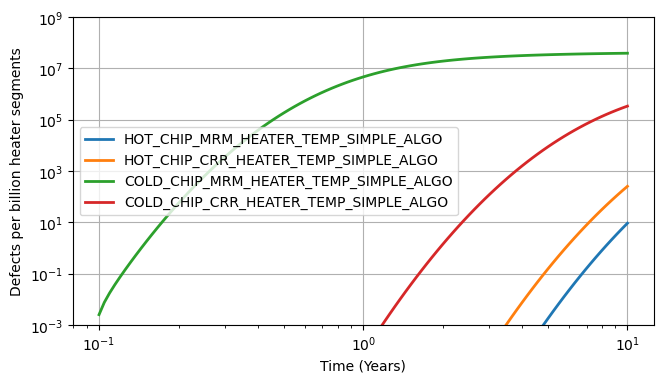

In [10]:
plt.figure(figsize=(7.5, 4)) 
for string in ['HOT_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO', 'HOT_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO','COLD_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO', 'COLD_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO']:
      stats_ecdf = stats.ecdf(mc_htr_temp[string].values)
      quantiles = stats_ecdf.cdf.quantiles
      pdf = stats_ecdf.cdf.probabilities
      T_range = quantiles + const.zero_Celsius
      kTinv_range = const.eV / T_range / const.k

      Ea_fit = np.array([1.966256206948785, np.log(8.88893341469434e-15)])

      fit_factor = 22

      mttf_range = np.exp(Ea_fit[1]) * np.exp(Ea_fit[0] * kTinv_range)*fit_factor
      sigma = 0.4

      size = 101

      years = np.logspace(-1, 1, size)

      frac_years = np.zeros((len(T_range), len(years)))

      for idx in range(len(T_range)):
            for idy in range(len(years)):
                  s = stats.lognorm(s=sigma, scale=mttf_range[idx])
                  frac_years[idx, idy] = s.pdf(years[idy]*365*24)
      plt.loglog(years, np.cumsum(frac_years.T @ pdf)*1e9, label = string, linewidth=2.0)
      plt.grid(True)
      plt.ylim([1e-3, 1e9])
      plt.xlabel('Time (Years)')
      plt.ylabel('Defects per billion heater segments')
      plt.legend()
plt.show()

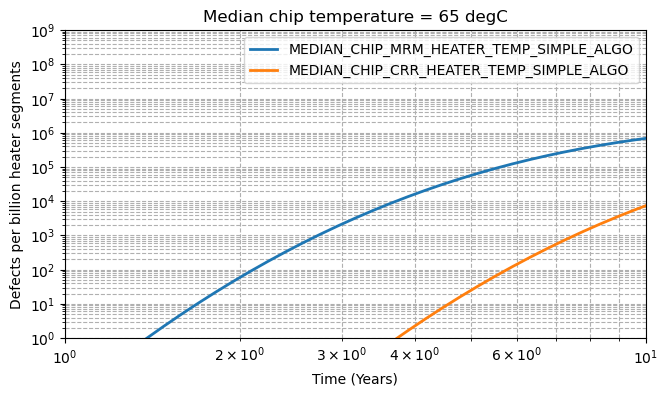

In [11]:
plt.figure(figsize=(7.5, 4)) 
for string in ['MEDIAN_CHIP_MRM_HEATER_TEMP_SIMPLE_ALGO', 'MEDIAN_CHIP_CRR_HEATER_TEMP_SIMPLE_ALGO']:
      stats_ecdf = stats.ecdf(mc_htr_temp[string].values)
      quantiles = stats_ecdf.cdf.quantiles
      pdf = stats_ecdf.cdf.probabilities
      T_range = quantiles + const.zero_Celsius
      kTinv_range = const.eV / T_range / const.k

      Ea_fit = np.array([1.966256206948785, np.log(8.88893341469434e-15)])

      fit_factor = 22

      mttf_range = np.exp(Ea_fit[1]) * np.exp(Ea_fit[0] * kTinv_range)*fit_factor
      sigma = 0.4

      size = 101

      years = np.logspace(-1, 2, size)

      frac_years = np.zeros((len(T_range), len(years)))

      for idx in range(len(T_range)):
            for idy in range(len(years)):
                  s = stats.lognorm(s=sigma, scale=mttf_range[idx])
                  frac_years[idx, idy] = s.pdf(years[idy]*365*24)
      plt.loglog(years, np.cumsum(frac_years.T @ pdf)*1e9, label = string, linewidth=2.0)
      plt.grid(True, which="both", ls="--")
      plt.xlim([1e0, 1e1])
      plt.ylim([1e0, 1e9])
      plt.xlabel('Time (Years)')
      plt.ylabel('Defects per billion heater segments')
      plt.title('Median chip temperature = 65 degC')
      plt.legend()
plt.show()

In [12]:
jaguar_1 = (256*4) *50/10**9
jaguar_1

5.12e-05

In [13]:
jaguar_1 = (256*4) *5/10**9
jaguar_1

5.12e-06